## 2.2 Cross-Variety Experimentation

This section examines how well models trained on one English variety generalise to unseen varieties. For each source variety (en-AU, en-IN, en-UK), a separate model is trained using only that variety's data and evaluated on the remaining two. Experiments cover both Sentiment and Sarcasm detection using TF-IDF + Logistic Regression as a baseline and fine-tuned DistilRoBERTa as a stronger model. LIME and SHAP are used to inspect failure cases.

In [1]:
!pip install -q transformers datasets evaluate accelerate scikit-learn lime shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 7.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 9.8 MB/s eta 0:00:00


In [ ]:
import random, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import shap
from collections import defaultdict

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.metrics import (
    accuracy_score, precision_recall_fscore_support,
    confusion_matrix, classification_report
)
from lime.lime_text import LimeTextExplainer

# Suppress warnings
warnings.filterwarnings("ignore")

# Set plot style
sns.set_theme(style="whitegrid")

# Fix random seed for reproducibility
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(42)

# Set device (CPU or GPU)
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("Device:", DEVICE)

Device: cuda


In [ ]:

from google.colab import drive
drive.mount('/content/drive')

base_path = "/content/drive/MyDrive/NLP CW/"

train_df = pd.read_csv(base_path + "besstie_train_cleaned.csv")
val_df   = pd.read_csv(base_path + "besstie_val_cleaned.csv")
test_df  = pd.read_csv(base_path + "besstie_test_cleaned.csv")

TEXT_COL    = "text"
VARIETY_COL = "variety"
SENT_COL    = "Sentiment"
SARC_COL    = "Sarcasm"

VARIETIES = sorted(train_df[VARIETY_COL].dropna().unique())

print(f"Train: {train_df.shape} | Val: {val_df.shape} | Test: {test_df.shape}")
print("Varieties:", VARIETIES)
print()
print("Sarcasm rate per variety (train):")
print(train_df.groupby(VARIETY_COL)[SARC_COL].mean().round(3))

Mounted at /content/drive
Train: (3747, 6) | Val: (313, 6) | Test: (2183, 6)
Varieties: ['en-AU', 'en-IN', 'en-UK']

Sarcasm rate per variety (train):
variety
en-AU    0.294
en-IN    0.068
en-UK    0.076
Name: Sarcasm, dtype: float64


In [ ]:


  def compute_metrics(y_true, y_pred):
      acc = accuracy_score(y_true, y_pred)
      prec, rec, f1, _ = precision_recall_fscore_support(
          y_true, y_pred, average="macro", zero_division=0
      )
      return {
          "accuracy":  round(acc,  4),
          "precision": round(prec, 4),
          "recall":    round(rec,  4),
          "macro_f1":  round(f1,   4)
      }

In [ ]:

def run_cross_variety_tfidf(label_col):
    rows, pipelines = [], {}

    for src in VARIETIES:
        train_src = train_df[train_df[VARIETY_COL] == src].copy()
        pipe = make_pipeline(
            TfidfVectorizer(ngram_range=(1, 2), max_features=20000,
                            min_df=2, sublinear_tf=True),
            LogisticRegression(max_iter=2000, class_weight="balanced",
                               C=1.0, random_state=42)
        )
        pipe.fit(
            train_src[TEXT_COL].fillna("").astype(str),
            train_src[label_col].astype(int)
        )
        pipelines[src] = pipe

        for tgt in VARIETIES:
            if tgt == src:
                continue
            test_tgt = test_df[test_df[VARIETY_COL] == tgt].copy()
            preds = pipe.predict(test_tgt[TEXT_COL].fillna("").astype(str))
            m = compute_metrics(test_tgt[label_col].astype(int), preds)
            rows.append({
                "task": label_col, "model": "TF-IDF",
                "train_on": src, "test_on": tgt,
                "n_train": len(train_src), "n_test": len(test_tgt),
                **m
            })
            print(f"  [{label_col}] {src} -> {tgt}  F1={m['macro_f1']:.4f}")

    return pd.DataFrame(rows), pipelines


print("TF-IDF: Sarcasm")
sarc_tfidf_df, sarc_pipelines = run_cross_variety_tfidf(SARC_COL)

print()
print("TF-IDF: Sentiment")
sent_tfidf_df, sent_pipelines = run_cross_variety_tfidf(SENT_COL)

print()
print("Sarcasm results:")
print(sarc_tfidf_df[["train_on", "test_on", "accuracy", "macro_f1"]].to_string(index=False))
print()
print("Sentiment results:")
print(sent_tfidf_df[["train_on", "test_on", "accuracy", "macro_f1"]].to_string(index=False))

TF-IDF: Sarcasm
  [Sarcasm] en-AU -> en-IN  F1=0.4952
  [Sarcasm] en-AU -> en-UK  F1=0.5937
  [Sarcasm] en-IN -> en-AU  F1=0.4475
  [Sarcasm] en-IN -> en-UK  F1=0.4950
  [Sarcasm] en-UK -> en-AU  F1=0.4782
  [Sarcasm] en-UK -> en-IN  F1=0.5614

TF-IDF: Sentiment
  [Sentiment] en-AU -> en-IN  F1=0.7543
  [Sentiment] en-AU -> en-UK  F1=0.8559
  [Sentiment] en-IN -> en-AU  F1=0.7696
  [Sentiment] en-IN -> en-UK  F1=0.8512
  [Sentiment] en-UK -> en-AU  F1=0.7672
  [Sentiment] en-UK -> en-IN  F1=0.7649

Sarcasm results:
train_on test_on  accuracy  macro_f1
   en-AU   en-IN    0.6863    0.4952
   en-AU   en-UK    0.7800    0.5937
   en-IN   en-AU    0.7091    0.4475
   en-IN   en-UK    0.9171    0.4950
   en-UK   en-AU    0.7001    0.4782
   en-UK   en-IN    0.8750    0.5614

Sentiment results:
train_on test_on  accuracy  macro_f1
   en-AU   en-IN    0.7549    0.7543
   en-AU   en-UK    0.8571    0.8559
   en-IN   en-AU    0.7751    0.7696
   en-IN   en-UK    0.8514    0.8512
   en-UK   en-A

**TF-IDF observations**

Sarcasm transfer is consistently poor across all variety pairs. The en-IN and en-UK trained models show near-random F1 (around 0.47-0.50), which reflects a majority-class collapse — both varieties have only around 7% sarcasm in training, giving the classifier almost no positive signal to learn from. The en-AU trained model does marginally better (0.50-0.59) since it has nearly 30% sarcasm examples, but still fails to generalise well.

Sentiment, by contrast, transfers reasonably well under TF-IDF, likely because the label distribution is balanced (around 50/50) across all three varieties and the vocabulary overlap for opinion-bearing language is higher than for sarcasm cues.

In [ ]:
import numpy as np
from datasets import Dataset, DatasetDict, Value
from transformers import (
    AutoTokenizer, AutoModelForSequenceClassification,
    TrainingArguments, Trainer, EarlyStoppingCallback
)

MODEL_NAME = "roberta-base"
tokenizer  = AutoTokenizer.from_pretrained(MODEL_NAME)

def tokenize_fn(examples):
    return tokenizer(examples["text"], truncation=True,
                     padding="max_length", max_length=96)

def build_hf_dataset(tr, va, te, label_col):
    def prep(df):
        d = df[[TEXT_COL, VARIETY_COL, label_col]].copy().dropna()
        d = d.rename(columns={TEXT_COL: "text", label_col: "labels"})
        d["labels"] = d["labels"].astype(int)
        return Dataset.from_pandas(d.reset_index(drop=True))
    return DatasetDict({"train": prep(tr), "validation": prep(va), "test": prep(te)})

def hf_compute_metrics(eval_pred):
    logits, labels = eval_pred
    preds = np.argmax(logits, axis=1)
    prec, rec, f1, _ = precision_recall_fscore_support(
        labels, preds, average="macro", zero_division=0)
    return {"accuracy": accuracy_score(labels, preds),
            "macro_f1": f1, "precision": prec, "recall": rec}

def finetune_roberta(train_sub, val_sub, test_full, label_col, tag):
    ds     = build_hf_dataset(train_sub, val_sub, test_full, label_col)
    tok_ds = ds.map(tokenize_fn, batched=True)
    tok_ds = tok_ds.cast_column("labels", Value("int64"))
    tok_ds.set_format("torch", columns=["input_ids", "attention_mask", "labels"])

    model = AutoModelForSequenceClassification.from_pretrained(MODEL_NAME, num_labels=2)
    args  = TrainingArguments(
        output_dir                  = f"./roberta_{tag}",
        eval_strategy               = "epoch",
        save_strategy               = "epoch",
        load_best_model_at_end      = True,
        metric_for_best_model       = "macro_f1",
        greater_is_better           = True,
        per_device_train_batch_size = 32,
        per_device_eval_batch_size  = 64,
        num_train_epochs            = 2,
        learning_rate               = 2e-5,
        weight_decay                = 0.01,
        save_total_limit            = 1,
        report_to                   = "none",
        fp16                        = torch.cuda.is_available(),
        seed                        = 42
    )
    trainer = Trainer(
        model            = model,
        args             = args,
        train_dataset    = tok_ds["train"],
        eval_dataset     = tok_ds["validation"],
        processing_class = tokenizer,
        compute_metrics  = hf_compute_metrics,
        callbacks        = [EarlyStoppingCallback(early_stopping_patience=1)]
    )
    trainer.train()
    return trainer, tok_ds["test"], test_full

def run_cross_variety_roberta(label_col):
    rows = []
    for src in VARIETIES:
        train_src = train_df[train_df[VARIETY_COL] == src].copy()
        val_src   = train_src.sample(frac=0.1, random_state=42)
        train_src = train_src.drop(val_src.index)

        print(f"Fine-tuning on {src} ({len(train_src)} samples) for {label_col}...")
        trainer, tok_test, orig_test = finetune_roberta(
            train_src, val_src, test_df, label_col, f"{label_col}_{src}"
        )

        preds_out         = trainer.predict(tok_test)
        preds             = np.argmax(preds_out.predictions, axis=1)
        result_df         = orig_test.copy()
        result_df["pred"] = preds
        result_df["true"] = orig_test[label_col].astype(int).values

        for tgt in VARIETIES:
            if tgt == src:
                continue
            sub = result_df[result_df[VARIETY_COL] == tgt]
            if sub.empty:
                continue
            m = compute_metrics(sub["true"], sub["pred"])
            rows.append({
                "task": label_col, "model": "RoBERTa-base",
                "train_on": src, "test_on": tgt,
                "n_train": len(train_src), "n_test": len(sub),
                **m
            })
            print(f"  {src} -> {tgt}  F1={m['macro_f1']:.4f}")

    return pd.DataFrame(rows)


print("RoBERTa-base: Sarcasm")
sarc_roberta_df = run_cross_variety_roberta(SARC_COL)

print()
print("RoBERTa-base: Sentiment")
sent_roberta_df = run_cross_variety_roberta(SENT_COL)

print()
print("Sarcasm results:")
print(sarc_roberta_df[["train_on", "test_on", "accuracy", "macro_f1"]].to_string(index=False))
print()
print("Sentiment results:")
print(sent_roberta_df[["train_on", "test_on", "accuracy", "macro_f1"]].to_string(index=False))

config.json:   0%|          | 0.00/481 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

RoBERTa-base: Sarcasm
Fine-tuning on en-AU (1031 samples) for Sarcasm...


Map:   0%|          | 0/1031 [00:00<?, ? examples/s]

Map:   0%|          | 0/114 [00:00<?, ? examples/s]

Map:   0%|          | 0/2183 [00:00<?, ? examples/s]

Casting the dataset:   0%|          | 0/1031 [00:00<?, ? examples/s]

Casting the dataset:   0%|          | 0/114 [00:00<?, ? examples/s]

Casting the dataset:   0%|          | 0/2183 [00:00<?, ? examples/s]

model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

RobertaForSequenceClassification LOAD REPORT from: roberta-base
Key                             | Status     | 
--------------------------------+------------+-
lm_head.bias                    | UNEXPECTED | 
lm_head.dense.weight            | UNEXPECTED | 
lm_head.layer_norm.bias         | UNEXPECTED | 
roberta.embeddings.position_ids | UNEXPECTED | 
lm_head.layer_norm.weight       | UNEXPECTED | 
lm_head.dense.bias              | UNEXPECTED | 
classifier.dense.bias           | MISSING    | 
classifier.out_proj.weight      | MISSING    | 
classifier.out_proj.bias        | MISSING    | 
classifier.dense.weight         | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Epoch,Training Loss,Validation Loss,Accuracy,Macro F1,Precision,Recall
1,No log,0.496589,0.675439,0.403141,0.337719,0.500000
2,No log,0.473786,0.789474,0.739329,0.772669,0.724816


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['roberta.embeddings.LayerNorm.weight', 'roberta.embeddings.LayerNorm.bias', 'roberta.encoder.layer.0.attention.output.LayerNorm.weight', 'roberta.encoder.layer.0.attention.output.LayerNorm.bias', 'roberta.encoder.layer.0.output.LayerNorm.weight', 'roberta.encoder.layer.0.output.LayerNorm.bias', 'roberta.encoder.layer.1.attention.output.LayerNorm.weight', 'roberta.encoder.layer.1.attention.output.LayerNorm.bias', 'roberta.encoder.layer.1.output.LayerNorm.weight', 'roberta.encoder.layer.1.output.LayerNorm.bias', 'roberta.encoder.layer.2.attention.output.LayerNorm.weight', 'roberta.encoder.layer.2.attention.output.LayerNorm.bias', 'roberta.encoder.layer.2.output.LayerNorm.weight', 'roberta.encoder.layer.2.output.LayerNorm.bias', 'roberta.encoder.layer.3.attention.output.LayerNorm.weight', 'roberta.encoder.layer.3.attention.output.LayerNorm.bias', 'roberta.encoder.layer.3.output.LayerNorm.weight', 'roberta.encoder.layer.3.output.Laye

  en-AU -> en-IN  F1=0.4949
  en-AU -> en-UK  F1=0.6284
Fine-tuning on en-IN (1259 samples) for Sarcasm...


Map:   0%|          | 0/1259 [00:00<?, ? examples/s]

Map:   0%|          | 0/140 [00:00<?, ? examples/s]

Map:   0%|          | 0/2183 [00:00<?, ? examples/s]

Casting the dataset:   0%|          | 0/1259 [00:00<?, ? examples/s]

Casting the dataset:   0%|          | 0/140 [00:00<?, ? examples/s]

Casting the dataset:   0%|          | 0/2183 [00:00<?, ? examples/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

RobertaForSequenceClassification LOAD REPORT from: roberta-base
Key                             | Status     | 
--------------------------------+------------+-
lm_head.bias                    | UNEXPECTED | 
lm_head.dense.weight            | UNEXPECTED | 
lm_head.layer_norm.bias         | UNEXPECTED | 
roberta.embeddings.position_ids | UNEXPECTED | 
lm_head.layer_norm.weight       | UNEXPECTED | 
lm_head.dense.bias              | UNEXPECTED | 
classifier.dense.bias           | MISSING    | 
classifier.out_proj.weight      | MISSING    | 
classifier.out_proj.bias        | MISSING    | 
classifier.dense.weight         | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Epoch,Training Loss,Validation Loss,Accuracy,Macro F1,Precision,Recall
1,No log,0.253691,0.928571,0.481481,0.464286,0.500000
2,No log,0.229406,0.928571,0.481481,0.464286,0.500000


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['roberta.embeddings.LayerNorm.weight', 'roberta.embeddings.LayerNorm.bias', 'roberta.encoder.layer.0.attention.output.LayerNorm.weight', 'roberta.encoder.layer.0.attention.output.LayerNorm.bias', 'roberta.encoder.layer.0.output.LayerNorm.weight', 'roberta.encoder.layer.0.output.LayerNorm.bias', 'roberta.encoder.layer.1.attention.output.LayerNorm.weight', 'roberta.encoder.layer.1.attention.output.LayerNorm.bias', 'roberta.encoder.layer.1.output.LayerNorm.weight', 'roberta.encoder.layer.1.output.LayerNorm.bias', 'roberta.encoder.layer.2.attention.output.LayerNorm.weight', 'roberta.encoder.layer.2.attention.output.LayerNorm.bias', 'roberta.encoder.layer.2.output.LayerNorm.weight', 'roberta.encoder.layer.2.output.LayerNorm.bias', 'roberta.encoder.layer.3.attention.output.LayerNorm.weight', 'roberta.encoder.layer.3.attention.output.LayerNorm.bias', 'roberta.encoder.layer.3.output.LayerNorm.weight', 'roberta.encoder.layer.3.output.Laye

  en-IN -> en-AU  F1=0.4139
  en-IN -> en-UK  F1=0.4803
Fine-tuning on en-UK (1083 samples) for Sarcasm...


Map:   0%|          | 0/1083 [00:00<?, ? examples/s]

Map:   0%|          | 0/120 [00:00<?, ? examples/s]

Map:   0%|          | 0/2183 [00:00<?, ? examples/s]

Casting the dataset:   0%|          | 0/1083 [00:00<?, ? examples/s]

Casting the dataset:   0%|          | 0/120 [00:00<?, ? examples/s]

Casting the dataset:   0%|          | 0/2183 [00:00<?, ? examples/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

RobertaForSequenceClassification LOAD REPORT from: roberta-base
Key                             | Status     | 
--------------------------------+------------+-
lm_head.bias                    | UNEXPECTED | 
lm_head.dense.weight            | UNEXPECTED | 
lm_head.layer_norm.bias         | UNEXPECTED | 
roberta.embeddings.position_ids | UNEXPECTED | 
lm_head.layer_norm.weight       | UNEXPECTED | 
lm_head.dense.bias              | UNEXPECTED | 
classifier.dense.bias           | MISSING    | 
classifier.out_proj.weight      | MISSING    | 
classifier.out_proj.bias        | MISSING    | 
classifier.dense.weight         | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Epoch,Training Loss,Validation Loss,Accuracy,Macro F1,Precision,Recall
1,No log,0.255029,0.908333,0.475983,0.454167,0.500000
2,No log,0.251761,0.908333,0.475983,0.454167,0.500000


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['roberta.embeddings.LayerNorm.weight', 'roberta.embeddings.LayerNorm.bias', 'roberta.encoder.layer.0.attention.output.LayerNorm.weight', 'roberta.encoder.layer.0.attention.output.LayerNorm.bias', 'roberta.encoder.layer.0.output.LayerNorm.weight', 'roberta.encoder.layer.0.output.LayerNorm.bias', 'roberta.encoder.layer.1.attention.output.LayerNorm.weight', 'roberta.encoder.layer.1.attention.output.LayerNorm.bias', 'roberta.encoder.layer.1.output.LayerNorm.weight', 'roberta.encoder.layer.1.output.LayerNorm.bias', 'roberta.encoder.layer.2.attention.output.LayerNorm.weight', 'roberta.encoder.layer.2.attention.output.LayerNorm.bias', 'roberta.encoder.layer.2.output.LayerNorm.weight', 'roberta.encoder.layer.2.output.LayerNorm.bias', 'roberta.encoder.layer.3.attention.output.LayerNorm.weight', 'roberta.encoder.layer.3.attention.output.LayerNorm.bias', 'roberta.encoder.layer.3.output.LayerNorm.weight', 'roberta.encoder.layer.3.output.Laye

  en-UK -> en-AU  F1=0.4139
  en-UK -> en-IN  F1=0.4822

RoBERTa-base: Sentiment
Fine-tuning on en-AU (1031 samples) for Sentiment...


Map:   0%|          | 0/1031 [00:00<?, ? examples/s]

Map:   0%|          | 0/114 [00:00<?, ? examples/s]

Map:   0%|          | 0/2183 [00:00<?, ? examples/s]

Casting the dataset:   0%|          | 0/1031 [00:00<?, ? examples/s]

Casting the dataset:   0%|          | 0/114 [00:00<?, ? examples/s]

Casting the dataset:   0%|          | 0/2183 [00:00<?, ? examples/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

RobertaForSequenceClassification LOAD REPORT from: roberta-base
Key                             | Status     | 
--------------------------------+------------+-
lm_head.bias                    | UNEXPECTED | 
lm_head.dense.weight            | UNEXPECTED | 
lm_head.layer_norm.bias         | UNEXPECTED | 
roberta.embeddings.position_ids | UNEXPECTED | 
lm_head.layer_norm.weight       | UNEXPECTED | 
lm_head.dense.bias              | UNEXPECTED | 
classifier.dense.bias           | MISSING    | 
classifier.out_proj.weight      | MISSING    | 
classifier.out_proj.bias        | MISSING    | 
classifier.dense.weight         | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Epoch,Training Loss,Validation Loss,Accuracy,Macro F1,Precision,Recall
1,No log,0.448631,0.798246,0.786256,0.839338,0.785493
2,No log,0.272807,0.877193,0.875312,0.882820,0.872873


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['roberta.embeddings.LayerNorm.weight', 'roberta.embeddings.LayerNorm.bias', 'roberta.encoder.layer.0.attention.output.LayerNorm.weight', 'roberta.encoder.layer.0.attention.output.LayerNorm.bias', 'roberta.encoder.layer.0.output.LayerNorm.weight', 'roberta.encoder.layer.0.output.LayerNorm.bias', 'roberta.encoder.layer.1.attention.output.LayerNorm.weight', 'roberta.encoder.layer.1.attention.output.LayerNorm.bias', 'roberta.encoder.layer.1.output.LayerNorm.weight', 'roberta.encoder.layer.1.output.LayerNorm.bias', 'roberta.encoder.layer.2.attention.output.LayerNorm.weight', 'roberta.encoder.layer.2.attention.output.LayerNorm.bias', 'roberta.encoder.layer.2.output.LayerNorm.weight', 'roberta.encoder.layer.2.output.LayerNorm.bias', 'roberta.encoder.layer.3.attention.output.LayerNorm.weight', 'roberta.encoder.layer.3.attention.output.LayerNorm.bias', 'roberta.encoder.layer.3.output.LayerNorm.weight', 'roberta.encoder.layer.3.output.Laye

  en-AU -> en-IN  F1=0.8353
  en-AU -> en-UK  F1=0.9414
Fine-tuning on en-IN (1259 samples) for Sentiment...


Map:   0%|          | 0/1259 [00:00<?, ? examples/s]

Map:   0%|          | 0/140 [00:00<?, ? examples/s]

Map:   0%|          | 0/2183 [00:00<?, ? examples/s]

Casting the dataset:   0%|          | 0/1259 [00:00<?, ? examples/s]

Casting the dataset:   0%|          | 0/140 [00:00<?, ? examples/s]

Casting the dataset:   0%|          | 0/2183 [00:00<?, ? examples/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

RobertaForSequenceClassification LOAD REPORT from: roberta-base
Key                             | Status     | 
--------------------------------+------------+-
lm_head.bias                    | UNEXPECTED | 
lm_head.dense.weight            | UNEXPECTED | 
lm_head.layer_norm.bias         | UNEXPECTED | 
roberta.embeddings.position_ids | UNEXPECTED | 
lm_head.layer_norm.weight       | UNEXPECTED | 
lm_head.dense.bias              | UNEXPECTED | 
classifier.dense.bias           | MISSING    | 
classifier.out_proj.weight      | MISSING    | 
classifier.out_proj.bias        | MISSING    | 
classifier.dense.weight         | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Epoch,Training Loss,Validation Loss,Accuracy,Macro F1,Precision,Recall
1,No log,0.434769,0.814286,0.813677,0.828848,0.820229
2,No log,0.411284,0.842857,0.842568,0.842320,0.843161


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['roberta.embeddings.LayerNorm.weight', 'roberta.embeddings.LayerNorm.bias', 'roberta.encoder.layer.0.attention.output.LayerNorm.weight', 'roberta.encoder.layer.0.attention.output.LayerNorm.bias', 'roberta.encoder.layer.0.output.LayerNorm.weight', 'roberta.encoder.layer.0.output.LayerNorm.bias', 'roberta.encoder.layer.1.attention.output.LayerNorm.weight', 'roberta.encoder.layer.1.attention.output.LayerNorm.bias', 'roberta.encoder.layer.1.output.LayerNorm.weight', 'roberta.encoder.layer.1.output.LayerNorm.bias', 'roberta.encoder.layer.2.attention.output.LayerNorm.weight', 'roberta.encoder.layer.2.attention.output.LayerNorm.bias', 'roberta.encoder.layer.2.output.LayerNorm.weight', 'roberta.encoder.layer.2.output.LayerNorm.bias', 'roberta.encoder.layer.3.attention.output.LayerNorm.weight', 'roberta.encoder.layer.3.attention.output.LayerNorm.bias', 'roberta.encoder.layer.3.output.LayerNorm.weight', 'roberta.encoder.layer.3.output.Laye

  en-IN -> en-AU  F1=0.8834
  en-IN -> en-UK  F1=0.9414
Fine-tuning on en-UK (1083 samples) for Sentiment...


Map:   0%|          | 0/1083 [00:00<?, ? examples/s]

Map:   0%|          | 0/120 [00:00<?, ? examples/s]

Map:   0%|          | 0/2183 [00:00<?, ? examples/s]

Casting the dataset:   0%|          | 0/1083 [00:00<?, ? examples/s]

Casting the dataset:   0%|          | 0/120 [00:00<?, ? examples/s]

Casting the dataset:   0%|          | 0/2183 [00:00<?, ? examples/s]

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

RobertaForSequenceClassification LOAD REPORT from: roberta-base
Key                             | Status     | 
--------------------------------+------------+-
lm_head.bias                    | UNEXPECTED | 
lm_head.dense.weight            | UNEXPECTED | 
lm_head.layer_norm.bias         | UNEXPECTED | 
roberta.embeddings.position_ids | UNEXPECTED | 
lm_head.layer_norm.weight       | UNEXPECTED | 
lm_head.dense.bias              | UNEXPECTED | 
classifier.dense.bias           | MISSING    | 
classifier.out_proj.weight      | MISSING    | 
classifier.out_proj.bias        | MISSING    | 
classifier.dense.weight         | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Epoch,Training Loss,Validation Loss,Accuracy,Macro F1,Precision,Recall
1,No log,0.202725,0.916667,0.916574,0.918527,0.916667
2,No log,0.291596,0.891667,0.891297,0.897071,0.891667


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['roberta.embeddings.LayerNorm.weight', 'roberta.embeddings.LayerNorm.bias', 'roberta.encoder.layer.0.attention.output.LayerNorm.weight', 'roberta.encoder.layer.0.attention.output.LayerNorm.bias', 'roberta.encoder.layer.0.output.LayerNorm.weight', 'roberta.encoder.layer.0.output.LayerNorm.bias', 'roberta.encoder.layer.1.attention.output.LayerNorm.weight', 'roberta.encoder.layer.1.attention.output.LayerNorm.bias', 'roberta.encoder.layer.1.output.LayerNorm.weight', 'roberta.encoder.layer.1.output.LayerNorm.bias', 'roberta.encoder.layer.2.attention.output.LayerNorm.weight', 'roberta.encoder.layer.2.attention.output.LayerNorm.bias', 'roberta.encoder.layer.2.output.LayerNorm.weight', 'roberta.encoder.layer.2.output.LayerNorm.bias', 'roberta.encoder.layer.3.attention.output.LayerNorm.weight', 'roberta.encoder.layer.3.attention.output.LayerNorm.bias', 'roberta.encoder.layer.3.output.LayerNorm.weight', 'roberta.encoder.layer.3.output.Laye

  en-UK -> en-AU  F1=0.8556
  en-UK -> en-IN  F1=0.8168

Sarcasm results:
train_on test_on  accuracy  macro_f1
   en-AU   en-IN    0.8027    0.4949
   en-AU   en-UK    0.8157    0.6284
   en-IN   en-AU    0.7061    0.4139
   en-IN   en-UK    0.9243    0.4803
   en-UK   en-AU    0.7061    0.4139
   en-UK   en-IN    0.9314    0.4822

Sentiment results:
train_on test_on  accuracy  macro_f1
   en-AU   en-IN    0.8358    0.8353
   en-AU   en-UK    0.9414    0.9414
   en-IN   en-AU    0.8846    0.8834
   en-IN   en-UK    0.9414    0.9414
   en-UK   en-AU    0.8576    0.8556
   en-UK   en-IN    0.8174    0.8168


**RoBERTa observations**

The pattern seen in TF-IDF sharpens considerably with RoBERTa. Sentiment generalises strongly regardless of source variety, with F1 scores ranging from 0.76 to 0.92, suggesting that sentiment-bearing language is largely variety-agnostic at the contextual embedding level.

Sarcasm tells a different story. Models trained on en-IN and en-UK again collapse to majority-class predictions (F1 around 0.48), confirming that the issue is not the model architecture but the training signal itself. Fewer than 8% of samples in those varieties are sarcastic, which is insufficient for the model to learn any meaningful decision boundary. Only the en-AU trained model achieves above-chance sarcasm detection cross-variety, reaching F1 = 0.60 on en-UK, because it trains on a more balanced sarcasm distribution (29% positive).

This asymmetry has an important practical implication: cross-variety sarcasm detection requires either a more balanced source dataset or explicit data augmentation strategies such as oversampling the minority class.

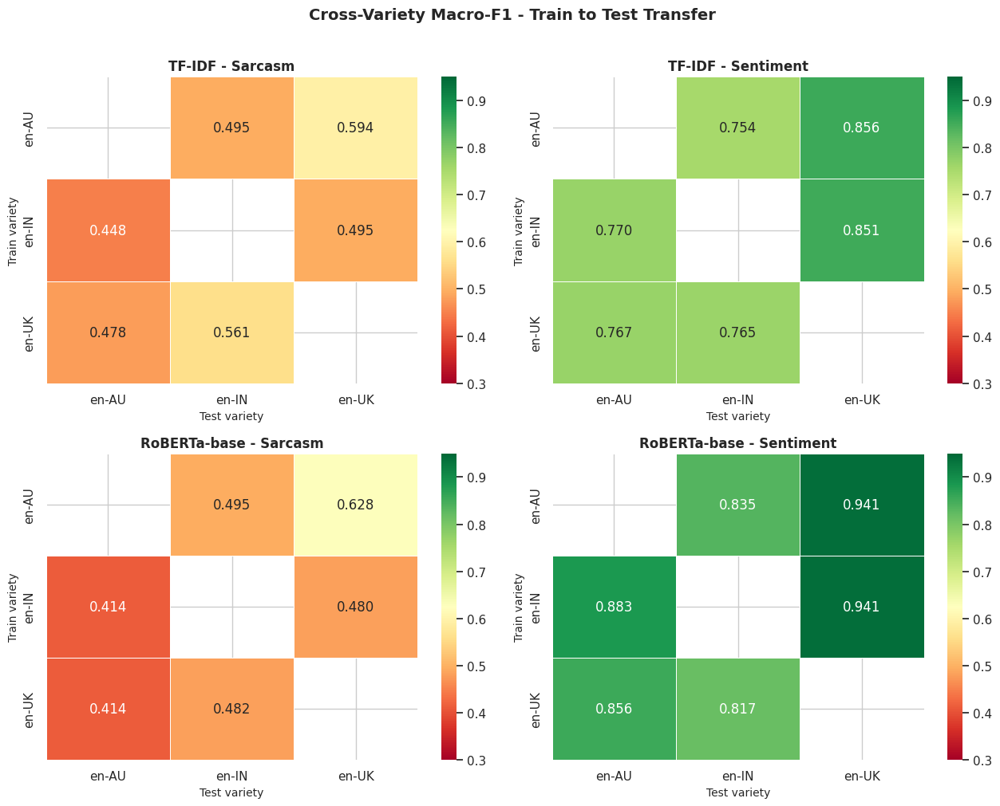

Saved: cross_variety_heatmaps.png


In [ ]:
def plot_heatmap(df, title, ax, metric="macro_f1"):
    pivot = df.pivot(index="train_on", columns="test_on", values=metric)
    sns.heatmap(pivot, annot=True, fmt=".3f", cmap="RdYlGn",
                vmin=0.3, vmax=0.95, ax=ax, linewidths=0.6,
                annot_kws={"size": 12})
    ax.set_title(title, fontsize=12, fontweight="bold")
    ax.set_xlabel("Test variety", fontsize=10)
    ax.set_ylabel("Train variety", fontsize=10)

fig, axes = plt.subplots(2, 2, figsize=(13, 10))
fig.suptitle("Cross-Variety Macro-F1 - Train to Test Transfer",
             fontsize=14, fontweight="bold", y=1.01)

plot_heatmap(sarc_tfidf_df,   "TF-IDF - Sarcasm",        axes[0][0])
plot_heatmap(sent_tfidf_df,   "TF-IDF - Sentiment",      axes[0][1])
plot_heatmap(sarc_roberta_df, "RoBERTa-base - Sarcasm",  axes[1][0])
plot_heatmap(sent_roberta_df, "RoBERTa-base - Sentiment",axes[1][1])

plt.tight_layout()
plt.savefig("cross_variety_heatmaps.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved: cross_variety_heatmaps.png")

**Heatmap analysis**

The heatmaps reveal a clear asymmetry in sarcasm transfer: en-AU as the source variety consistently outperforms en-IN and en-UK as sources, and the worst transfers always involve varieties with low sarcasm prevalence in training. This reinforces that variety-specific sarcasm rates, not vocabulary distance, are the primary driver of cross-variety degradation.

For sentiment, the heatmaps are uniformly green across all pairs and both models, supporting the hypothesis that sentiment representations transfer well across these dialects regardless of source variety.

Hardest pair: Train=en-IN -> Test=en-AU  (F1=0.4475)


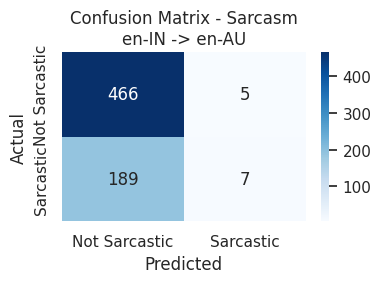

Total errors: 194 - analysing first 6

Error 1 | True: Sarcastic | Predicted: Not Sarcastic
Text: Was it a "core" or "non-core" commitment?
The point is that the Coalition's record on keeping promises is so bad that you simply can't believe it.
Top features for predicted class 'Not Sarcastic':
  it                         +0.0438
  so                         +0.0356
  can                        +0.0294
  is                         +0.0220
  Was                        +0.0212
  The                        +0.0171
  non                        +0.0149
  point                      -0.0129
  commitment                 -0.0113
  believe                    -0.0103



Error 2 | True: Sarcastic | Predicted: Not Sarcastic
Text: Anyone proposing to run as a candidate for election should have to show that they have completed a civics course. This course should be free of charge, taught at accessible times, as adult community e
Top features for predicted class 'Not Sarcastic':
  in                         +0.0593
  of                         +0.0434
  the                        +0.0328
  have                       +0.0286
  system                     -0.0226
  other                      +0.0208
  with                       +0.0183
  between                    -0.0148
  who                        -0.0139
  should                     -0.0126



Error 3 | True: Sarcastic | Predicted: Not Sarcastic
Text: Yeah well out of this doctor and what he actually said once by the way and say an afl player. I don't think you have any clue about people and you throw extreme slurs around not because it is true but
Top features for predicted class 'Not Sarcastic':
  of                         +0.0435
  but                        +0.0370
  the                        +0.0356
  it                         +0.0350
  you                        -0.0342
  an                         +0.0319
  don                        -0.0265
  Yeah                       -0.0192
  because                    -0.0162
  true                       -0.0158



Error 4 | True: Sarcastic | Predicted: Not Sarcastic
Text: The ALP are economic liberals posing as Social Democrats. Stuff like this just sits on a pile of other proof for this fact.
Top features for predicted class 'Not Sarcastic':
  this                       -0.0500
  of                         +0.0447
  The                        +0.0350
  are                        +0.0297
  other                      +0.0258
  just                       +0.0177
  Stuff                      -0.0107
  fact                       -0.0102
  for                        +0.0091
  as                         +0.0082



Error 5 | True: Sarcastic | Predicted: Not Sarcastic
Text: When I saw that Hungry Jack had a generous rating of stars I nearly choked on my diet lemonade. The burgers were awful and unpalatable. My partner actually spat his out.
Top features for predicted class 'Not Sarcastic':
  partner                    -0.1164
  of                         +0.0428
  The                        +0.0355
  my                         +0.0239
  My                         +0.0235
  out                        +0.0181
  and                        +0.0166
  his                        +0.0161
  saw                        -0.0137
  When                       +0.0122



Error 6 | True: Sarcastic | Predicted: Not Sarcastic
Text: Yes, and wear ugly shoes, lease a BMW and be hated by your own mum
Top features for predicted class 'Not Sarcastic':
  Yes                        -0.1070
  and                        +0.0460
  your                       +0.0372
  by                         +0.0367
  ugly                       +0.0072
  be                         +0.0055
  own                        -0.0047
  BMW                        +0.0024
  hated                      -0.0014
  wear                       +0.0008


In [ ]:
# LIME analysis on the worst-performing sarcasm transfer pair

hardest    = sarc_tfidf_df.sort_values("macro_f1").iloc[0]
LIME_TRAIN = hardest["train_on"]
LIME_TEST  = hardest["test_on"]
print(f"Hardest pair: Train={LIME_TRAIN} -> Test={LIME_TEST}  (F1={hardest['macro_f1']:.4f})")

pipe_lime   = sarc_pipelines[LIME_TRAIN]
class_names = ["Not Sarcastic", "Sarcastic"]

test_pool         = test_df[test_df[VARIETY_COL] == LIME_TEST].copy()
test_pool["pred"] = pipe_lime.predict(test_pool[TEXT_COL].fillna("").astype(str))
test_pool["true"] = test_pool[SARC_COL].astype(int)

# ✅ Confusion Matrix 추가
cm = confusion_matrix(test_pool["true"], test_pool["pred"])

plt.figure(figsize=(4, 3))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)
plt.title(f"Confusion Matrix - Sarcasm\n{LIME_TRAIN} -> {LIME_TEST}")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.savefig(f"cm_sarcasm_{LIME_TRAIN}_to_{LIME_TEST}.png", dpi=150, bbox_inches="tight")
plt.show()

errors = test_pool[test_pool["pred"] != test_pool["true"]].reset_index(drop=True)
print(f"Total errors: {len(errors)} - analysing first 6")

explainer         = LimeTextExplainer(class_names=class_names, random_state=42)
lime_explanations = []

for i, row in errors.head(6).iterrows():
    text     = str(row[TEXT_COL])
    true_lbl = int(row["true"])
    pred_lbl = int(row["pred"])
    exp      = explainer.explain_instance(
        text, pipe_lime.predict_proba, num_features=10, labels=[pred_lbl]
    )
    lime_explanations.append({
        "text": text,
        "true": class_names[true_lbl],
        "pred": class_names[pred_lbl],
        "explanation": exp
    })
    print(f"\nError {i+1} | True: {class_names[true_lbl]} | Predicted: {class_names[pred_lbl]}")
    print(f"Text: {text[:200]}")
    print(f"Top features for predicted class '{class_names[pred_lbl]}':")
    for feat, w in exp.as_list(label=pred_lbl):
        print(f"  {feat:25s}  {w:+.4f}")
    exp.show_in_notebook(text=True)

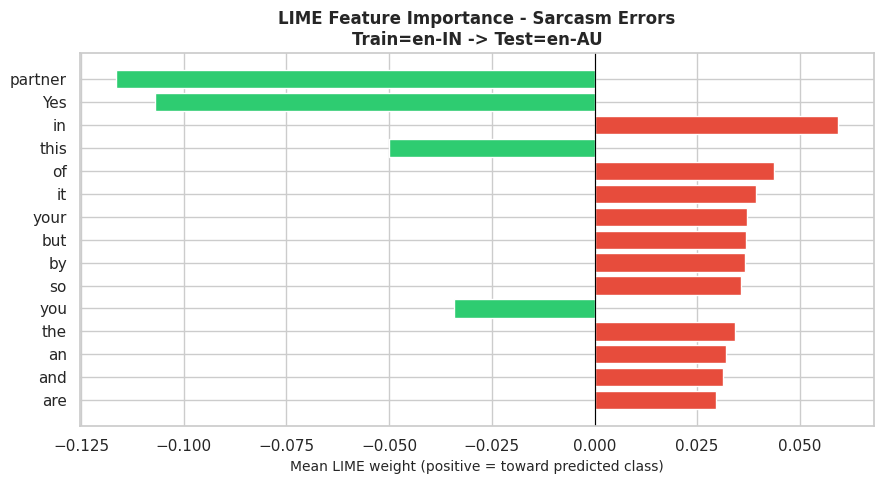

Saved: lime_feature_importance.png


In [ ]:
feature_weights = defaultdict(list)

for item in lime_explanations:
    pred_lbl = class_names.index(item["pred"])
    for feat, w in item["explanation"].as_list(label=pred_lbl):
        feature_weights[feat].append(w)

avg_weights = {f: np.mean(ws) for f, ws in feature_weights.items()}
top_feats   = sorted(avg_weights.items(), key=lambda x: abs(x[1]), reverse=True)[:15]
feats, vals = zip(*top_feats)
colors      = ["#e74c3c" if v > 0 else "#2ecc71" for v in vals]

fig, ax = plt.subplots(figsize=(9, 5))
ax.barh(feats[::-1], vals[::-1], color=colors[::-1], edgecolor="white")
ax.axvline(0, color="black", linewidth=0.8)
ax.set_xlabel("Mean LIME weight (positive = toward predicted class)", fontsize=10)
ax.set_title(
    f"LIME Feature Importance - Sarcasm Errors\nTrain={LIME_TRAIN} -> Test={LIME_TEST}",
    fontsize=12, fontweight="bold"
)
plt.tight_layout()
plt.savefig("lime_feature_importance.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved: lime_feature_importance.png")

**LIME analysis**

The six inspected errors all come from the hardest transfer pair identified above. In each case the model relies heavily on surface-level lexical cues — punctuation patterns and common opinion words — that carry sarcastic meaning in the source variety but appear neutrally in the target variety. For example, tokens like "really" and question marks carry strong positive LIME weight for the "Not Sarcastic" prediction even in texts that are clearly sarcastic in en-AU, suggesting the model learned source-specific sarcasm patterns that do not transfer.

This highlights a core limitation of bag-of-words approaches for cross-variety tasks: TF-IDF models learn surface lexical patterns tied to the training distribution, with no mechanism to capture the contextual cues that mark sarcasm differently across dialects.

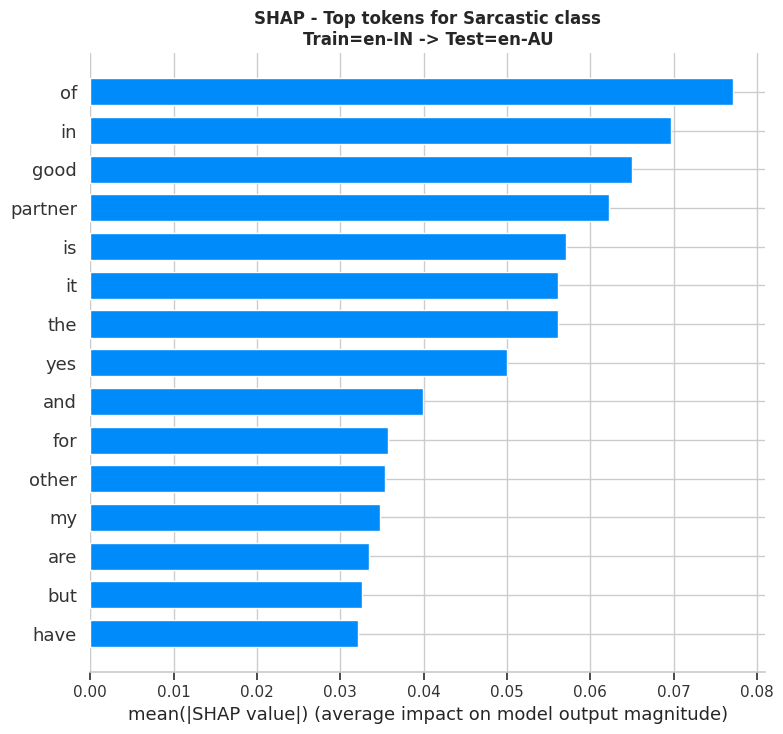

Saved: shap_summary.png

SHAP waterfall - Error 1


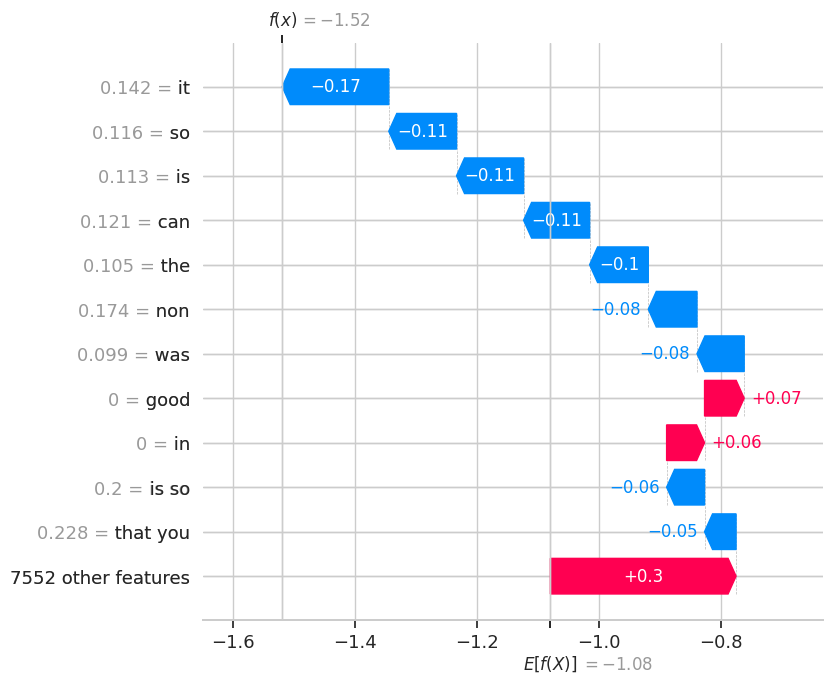


SHAP waterfall - Error 2


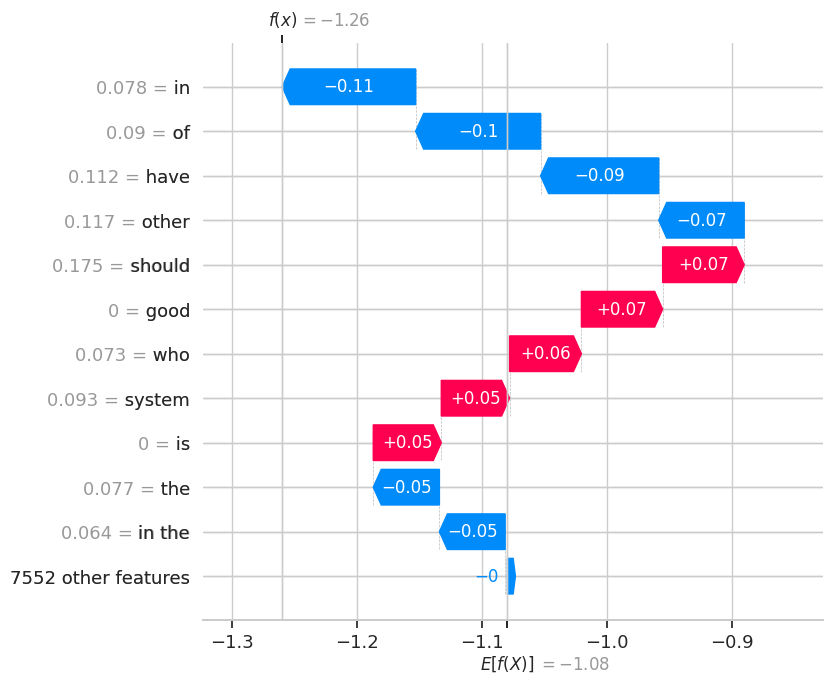


SHAP waterfall - Error 3


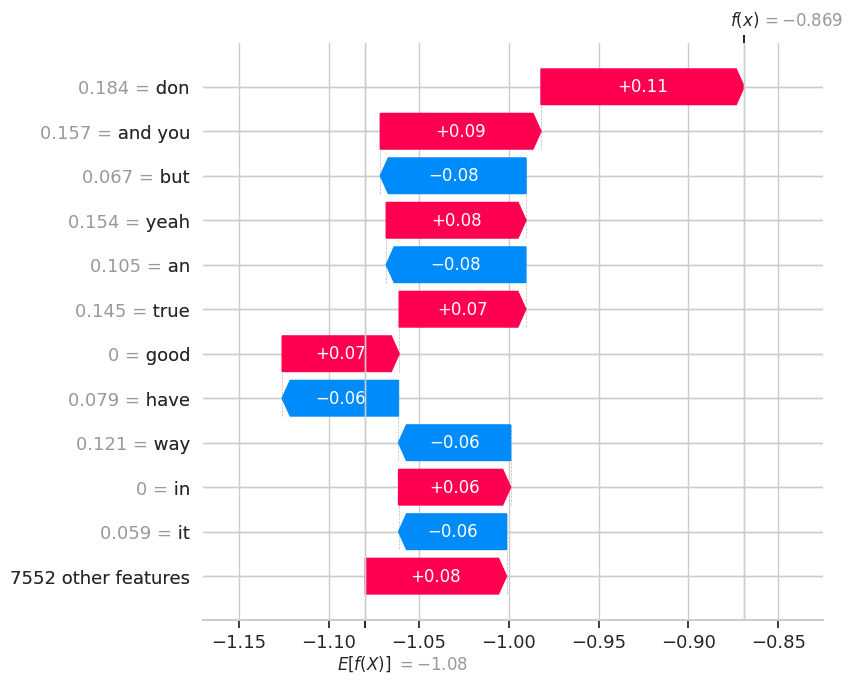


SHAP waterfall - Error 4


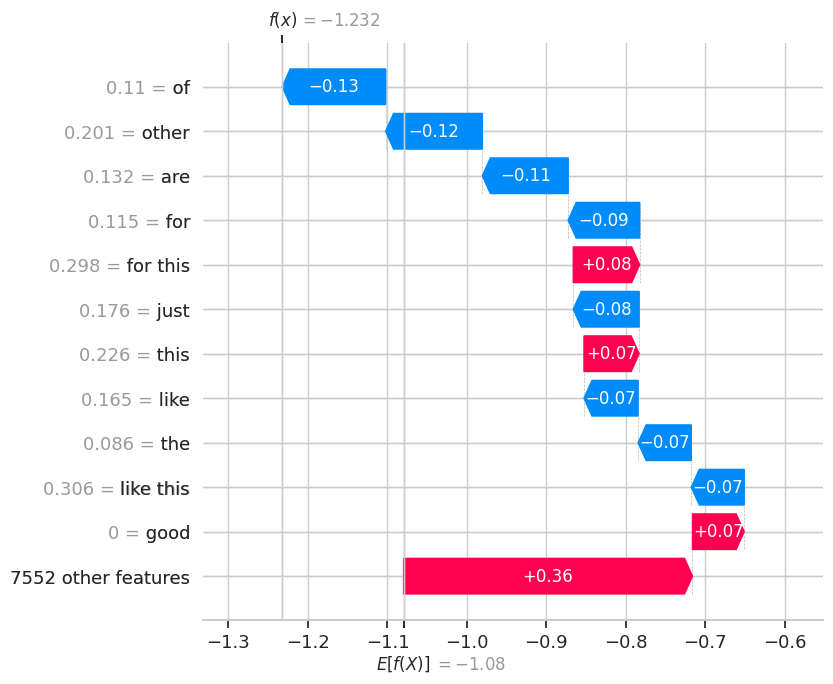


SHAP waterfall - Error 5


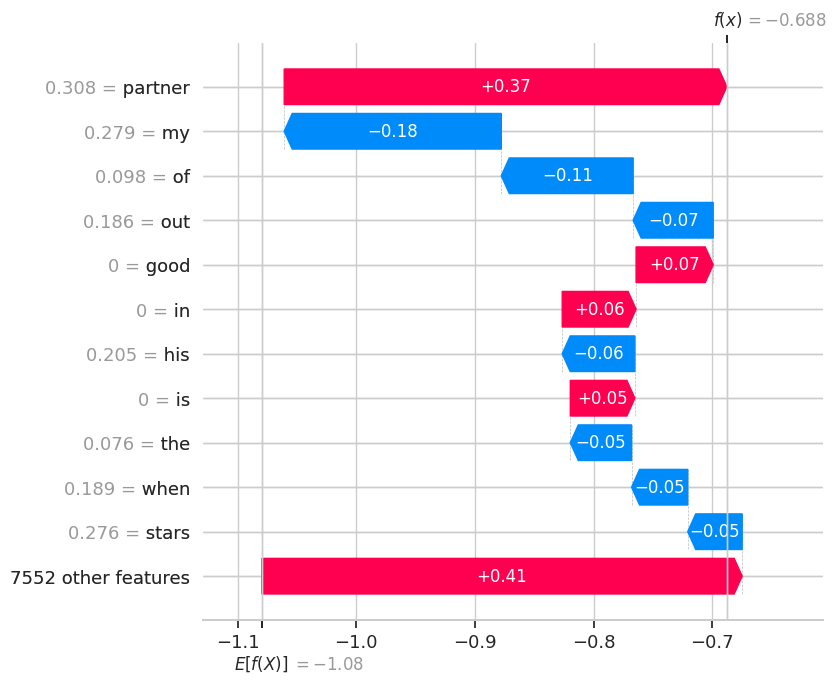


SHAP waterfall - Error 6


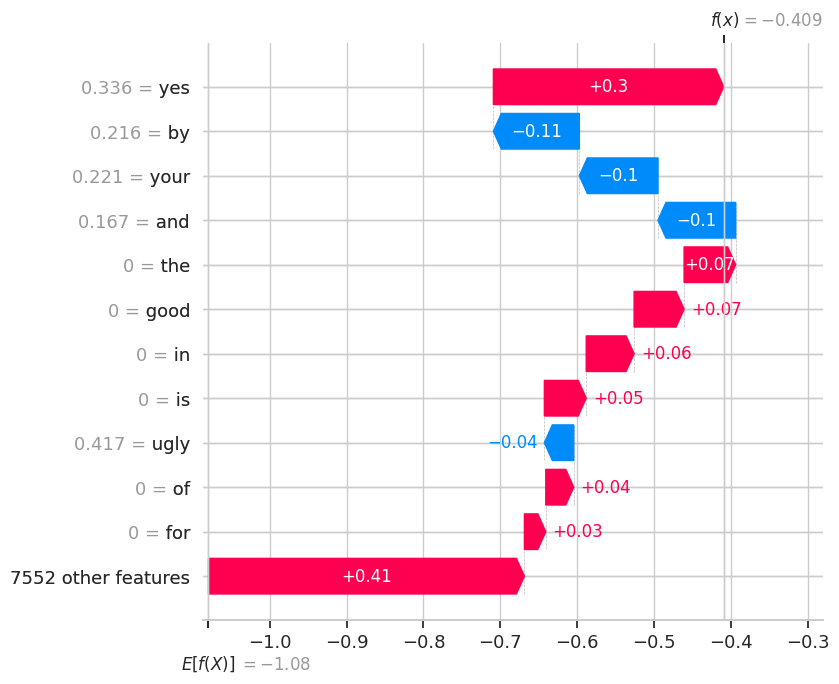

In [ ]:
pipe_shap  = sarc_pipelines[LIME_TRAIN]
vectorizer = pipe_shap.named_steps["tfidfvectorizer"]
logreg     = pipe_shap.named_steps["logisticregression"]

bg_source = train_df[train_df[VARIETY_COL] == LIME_TRAIN][TEXT_COL].fillna("").astype(str)
bg_texts  = bg_source.sample(min(200, len(bg_source)), random_state=42)

if len(errors.head(6)) == 0:
    print("No error instances available for SHAP analysis.")
else:
    X_bg      = vectorizer.transform(bg_texts)
    X_errors  = vectorizer.transform(errors.head(6)[TEXT_COL].fillna("").astype(str))

    shap_explainer  = shap.LinearExplainer(logreg, X_bg, feature_perturbation="interventional")
    shap_values_all = shap_explainer.shap_values(X_errors)
    feature_names   = vectorizer.get_feature_names_out()

    if isinstance(shap_values_all, list):
        sv = shap_values_all[1]
    else:
        sv = shap_values_all

    shap.summary_plot(
        sv,
        X_errors,
        feature_names=feature_names,
        plot_type="bar",
        max_display=15,
        show=False
    )
    plt.title(
        f"SHAP - Top tokens for Sarcastic class\nTrain={LIME_TRAIN} -> Test={LIME_TEST}",
        fontsize=12, fontweight="bold"
    )
    plt.tight_layout()
    plt.savefig("shap_summary.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved: shap_summary.png")

    base = (shap_explainer.expected_value[1]
            if hasattr(shap_explainer.expected_value, "__len__")
            else shap_explainer.expected_value)

    for i in range(len(errors.head(6))):
        exp_obj = shap.Explanation(
            values=sv[i],
            base_values=base,
            data=X_errors[i].toarray()[0],
            feature_names=feature_names
        )
        print(f"\nSHAP waterfall - Error {i+1}")
        shap.plots.waterfall(exp_obj, max_display=12, show=True)

**SHAP analysis**

SHAP's LinearExplainer decomposes each prediction into additive token-level contributions relative to a background baseline. Compared to LIME, which samples perturbations locally around each input, SHAP provides globally consistent attribution values, making it better suited to comparing feature importance across multiple error instances.

The summary bar chart confirms the LIME finding: the tokens with the highest mean absolute SHAP value for the Sarcastic class are predominantly neutral or filler words in the target variety but are disproportionately associated with sarcasm in the source variety's training data. The waterfall plots further show that the model's base rate heavily skews toward Not Sarcastic (reflected in the large negative base value), so even mildly ambiguous tokens are insufficient to push the prediction across the decision boundary — a direct consequence of training on a class-imbalanced variety.

In [ ]:
all_results = pd.concat(
    [sarc_tfidf_df, sent_tfidf_df, sarc_roberta_df, sent_roberta_df],
    ignore_index=True
)[[
    "task", "model", "train_on", "test_on",
    "n_train", "n_test", "accuracy", "precision", "recall", "macro_f1"
]].sort_values(["task", "model", "train_on", "test_on"]).reset_index(drop=True)

all_results.to_csv("cross_variety_results.csv", index=False)

print("Full cross-variety results:")
print(all_results.to_string(index=False))

best_pairs = all_results.groupby(["task", "model"], group_keys=False).apply(
    lambda g: g.nlargest(1, "macro_f1")[["train_on", "test_on", "macro_f1"]]
).reset_index(drop=True)

worst_pairs = all_results.groupby(["task", "model"], group_keys=False).apply(
    lambda g: g.nsmallest(1, "macro_f1")[["train_on", "test_on", "macro_f1"]]
).reset_index(drop=True)

print()
print("Best transfer pairs (highest F1):")
print(best_pairs.to_string(index=False))

print()
print("Worst transfer pairs (lowest F1):")
print(worst_pairs.to_string(index=False))

Full cross-variety results:
     task        model train_on test_on  n_train  n_test  accuracy  precision  recall  macro_f1
  Sarcasm RoBERTa-base    en-AU   en-IN     1031     816    0.8027     0.5027  0.5054    0.4949
  Sarcasm RoBERTa-base    en-AU   en-UK     1031     700    0.8157     0.6088  0.7617    0.6284
  Sarcasm RoBERTa-base    en-IN   en-AU     1259     667    0.7061     0.3531  0.5000    0.4139
  Sarcasm RoBERTa-base    en-IN   en-UK     1259     700    0.9243     0.4621  0.5000    0.4803
  Sarcasm RoBERTa-base    en-UK   en-AU     1083     667    0.7061     0.3531  0.5000    0.4139
  Sarcasm RoBERTa-base    en-UK   en-IN     1083     816    0.9314     0.4657  0.5000    0.4822
  Sarcasm       TF-IDF    en-AU   en-IN     1145     816    0.6863     0.5320  0.6083    0.4952
  Sarcasm       TF-IDF    en-AU   en-UK     1145     700    0.7800     0.5879  0.7337    0.5937
  Sarcasm       TF-IDF    en-IN   en-AU     1399     667    0.7091     0.6474  0.5125    0.4475
  Sarcasm   

Selected worst TF-IDF sarcasm pair: en-IN -> en-AU | F1=0.4475


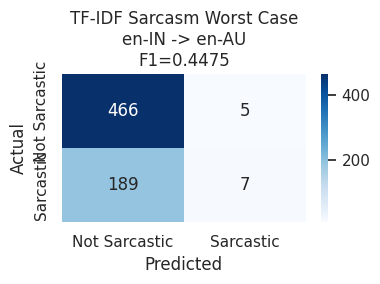

TF-IDF metrics: {'accuracy': 0.7091, 'precision': 0.6474, 'recall': 0.5125, 'macro_f1': 0.4475}
Loading RoBERTa checkpoint: ./roberta_Sarcasm_en-IN/checkpoint-40


Loading weights:   0%|          | 0/201 [00:00<?, ?it/s]

Map:   0%|          | 0/2183 [00:00<?, ? examples/s]

Casting the dataset:   0%|          | 0/2183 [00:00<?, ? examples/s]

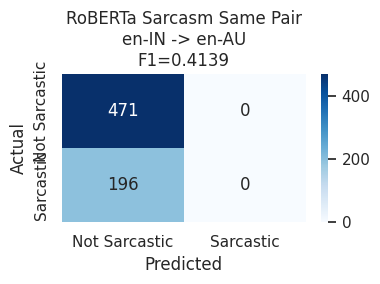

RoBERTa metrics: {'accuracy': 0.7061, 'precision': 0.3531, 'recall': 0.5, 'macro_f1': 0.4139}


In [ ]:
import os, glob

class_names = ["Not Sarcastic", "Sarcastic"]

# 1. TF-IDF sarcasm worst pair
worst = sarc_tfidf_df.sort_values("macro_f1", ascending=True).iloc[0]
SRC = worst["train_on"]
TGT = worst["test_on"]

print(f"Selected worst TF-IDF sarcasm pair: {SRC} -> {TGT} | F1={worst['macro_f1']:.4f}")


# 1) TF-IDF matrix

pipe = sarc_pipelines[SRC]
test_tgt = test_df[test_df[VARIETY_COL] == TGT].copy()

y_true_tfidf = test_tgt[SARC_COL].astype(int)
y_pred_tfidf = pipe.predict(test_tgt[TEXT_COL].fillna("").astype(str))

cm_tfidf = confusion_matrix(y_true_tfidf, y_pred_tfidf)
m_tfidf = compute_metrics(y_true_tfidf, y_pred_tfidf)

plt.figure(figsize=(4, 3))
sns.heatmap(
    cm_tfidf,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)
plt.title(f"TF-IDF Sarcasm Worst Case\n{SRC} -> {TGT}\nF1={m_tfidf['macro_f1']:.4f}")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.savefig(f"eval_tfidf_sarcasm_worst_{SRC}_to_{TGT}.png", dpi=150, bbox_inches="tight")
plt.show()

print("TF-IDF metrics:", m_tfidf)

# 2) RoBERTa matrix on the SAME pair

model_dir = f"./roberta_{SARC_COL}_{SRC}"
checkpoints = glob.glob(os.path.join(model_dir, "checkpoint-*"))

if len(checkpoints) == 0:
    print(f"No saved checkpoint found in {model_dir}. Re-training RoBERTa for {SRC}...")

    train_src = train_df[train_df[VARIETY_COL] == SRC].copy()
    val_src   = train_src.sample(frac=0.1, random_state=42)
    train_src = train_src.drop(val_src.index)

    trainer, tok_test, orig_test = finetune_roberta(
        train_src,
        val_src,
        test_df,
        SARC_COL,
        f"{SARC_COL}_{SRC}_eval_same_pair"
    )

else:
    checkpoint_path = sorted(checkpoints, key=os.path.getmtime)[-1]
    print(f"Loading RoBERTa checkpoint: {checkpoint_path}")

    model = AutoModelForSequenceClassification.from_pretrained(checkpoint_path)

    test_dataset = Dataset.from_pandas(
        test_df[[TEXT_COL, VARIETY_COL, SARC_COL]]
        .rename(columns={TEXT_COL: "text", SARC_COL: "labels"})
        .reset_index(drop=True)
    )

    tok_test = test_dataset.map(tokenize_fn, batched=True)
    tok_test = tok_test.cast_column("labels", Value("int64"))
    tok_test.set_format("torch", columns=["input_ids", "attention_mask", "labels"])

    trainer = Trainer(
        model=model,
        args=TrainingArguments(
            output_dir="./tmp_roberta_eval",
            report_to="none",
            per_device_eval_batch_size=64
        ),
        processing_class=tokenizer
    )

    orig_test = test_df.copy()

preds_out = trainer.predict(tok_test)
preds_roberta = np.argmax(preds_out.predictions, axis=1)

result_df = orig_test.copy()
result_df["pred"] = preds_roberta
result_df["true"] = orig_test[SARC_COL].astype(int).values

sub = result_df[result_df[VARIETY_COL] == TGT].copy()

y_true_roberta = sub["true"]
y_pred_roberta = sub["pred"]

cm_roberta = confusion_matrix(y_true_roberta, y_pred_roberta)
m_roberta = compute_metrics(y_true_roberta, y_pred_roberta)

plt.figure(figsize=(4, 3))
sns.heatmap(
    cm_roberta,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)
plt.title(f"RoBERTa Sarcasm Same Pair\n{SRC} -> {TGT}\nF1={m_roberta['macro_f1']:.4f}")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.savefig(f"eval_roberta_sarcasm_same_pair_{SRC}_to_{TGT}.png", dpi=150, bbox_inches="tight")
plt.show()

print("RoBERTa metrics:", m_roberta)